### Dart Detection
###### This is an exercise in using OpenCV 3.2 and python3 to detect darts thrown on a dart board using image processing

In [98]:
%matplotlib inline
import cv2
from matplotlib import pyplot as plt
import numpy as np
import time as t
print("OpenCV Version : %s " % cv2.__version__)

ImportError: No module named 'cv2.cv'; 'cv2' is not a package

In [182]:
ls samples

AAEO2187.MOV  IMG_0010.JPG* LGZT7865.MOV  TSLW0958.MOV
IMG_0008.JPG* IMG_3656.JPG  PKMN6853.MOV  WNZE0063.MOV
IMG_0009.JPG* IMG_3674.JPG  RXVX4887.MOV  arrow.png


In [16]:
PATH = r'samples/IMG_3656.JPG'
image = cv2.imread(PATH,cv2.IMREAD_COLOR)

Now matplotlib expects images as RGB, while OpenCV reads them as BGR. 
As a results we are switchingn the channels and render the images as a test.

In [ ]:
b,g,r = cv2.split(image)
image2 = cv2.merge([r,g,b])

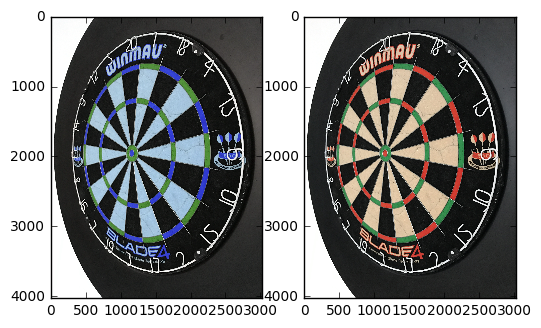

In [23]:
plt.subplot(121);plt.imshow(image)
plt.subplot(122);plt.imshow(image2)
plt.show()

Now let's define a function that takes care of the plotting with conversion if required for us - and also plot a bit bigger.

In [24]:
def convertToRgb(im):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

def plot(im, convert=False):
    fig, ax = plt.subplots(figsize=(18, 25))
    if convert:
        ax.imshow(convertToRgb(im))
    else:
        ax.imshow(im)

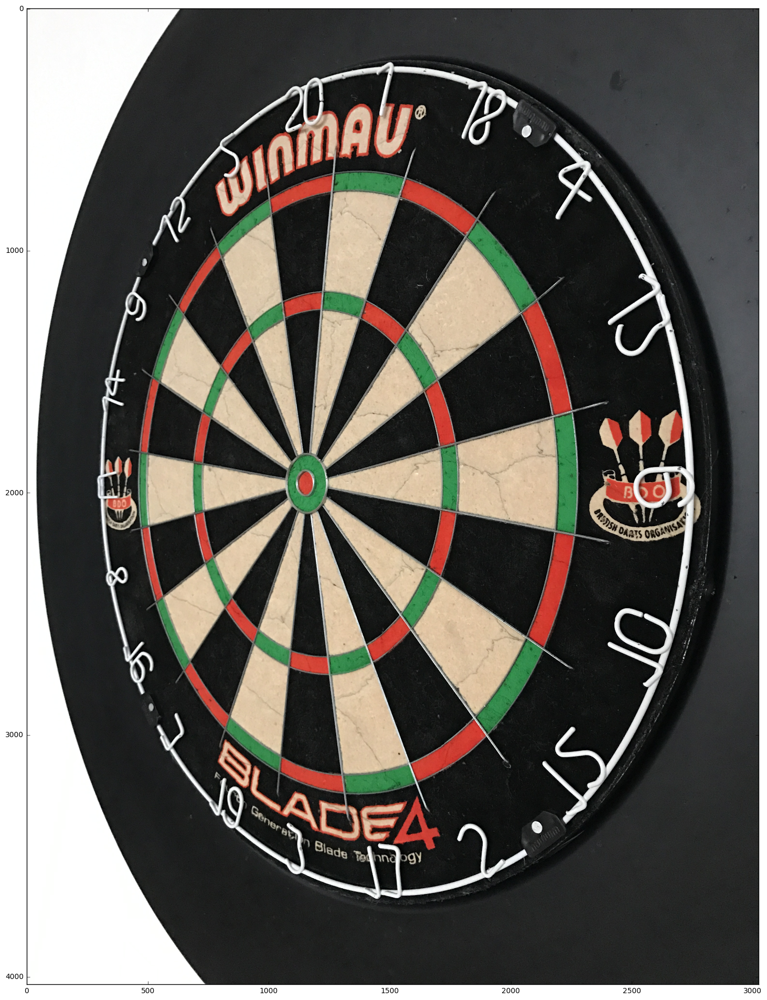

In [27]:
plot(image, 1)

Now let's load a 4K video and get a frame from it so we have our first arrow - and take another frame for background subtraction.

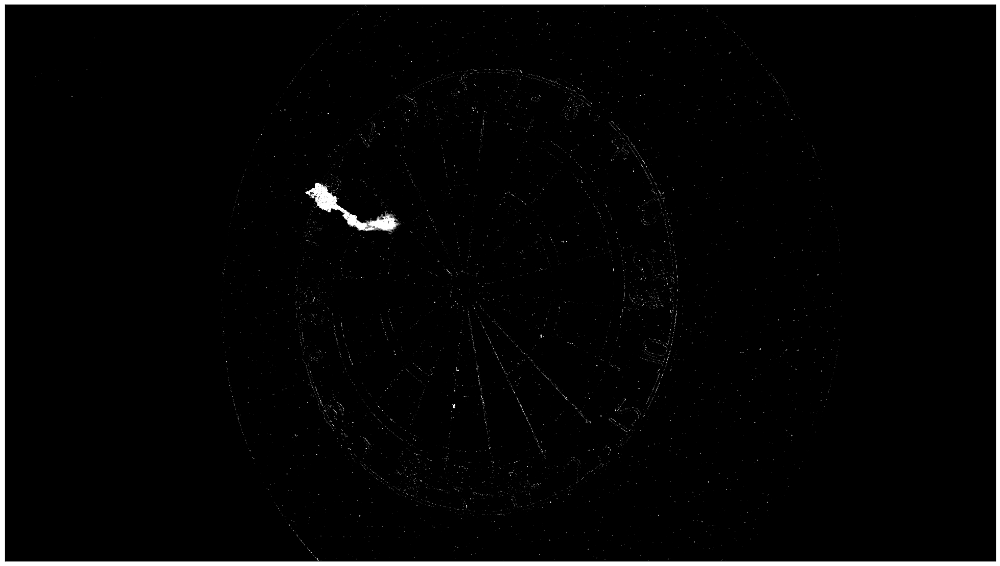

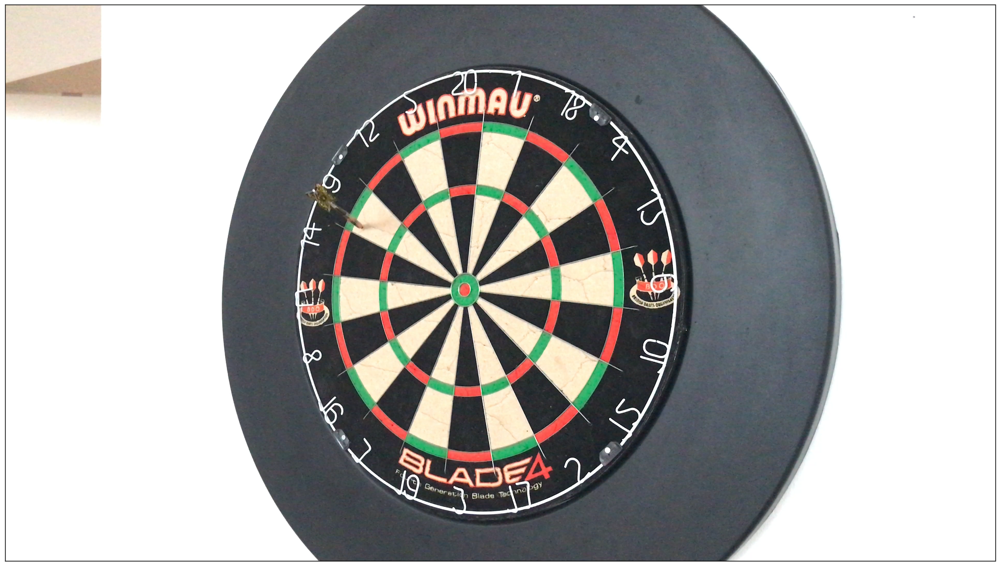

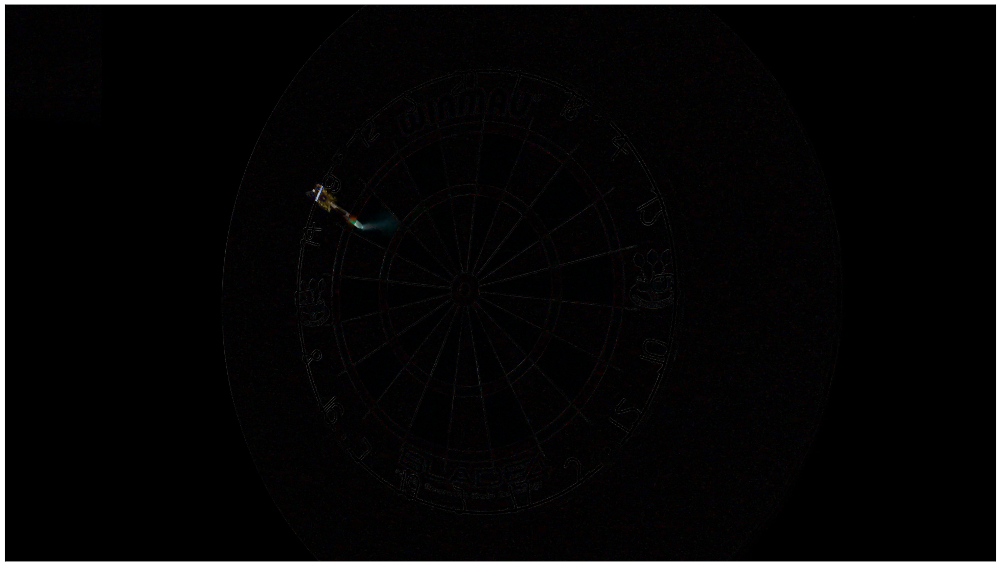

In [180]:
cap = cv2.VideoCapture('samples/AAEO2187.MOV')
i=0
fgbg = cv2.createBackgroundSubtractorMOG2()

fgbg.setDetectShadows(1)
fgbg.setShadowThreshold(0.5)

while(i<14):
    ret, frame = cap.read()
    fgmask = fgbg.apply(frame)
    i=i+1

#read next frame for arrow to not have motion blur 
ret, frame = cap.read()    
cap.release()


background = fgbg.getBackgroundImage()
plt.subplots(figsize=(25,25))
plt.xticks([]);plt.yticks([]);plt.imshow(fgmask,cmap='gray')
plt.show()
plt.subplots(figsize=(25,25))
plt.xticks([]);plt.yticks([]);plt.imshow(convertToRgb(frame))
plt.show()

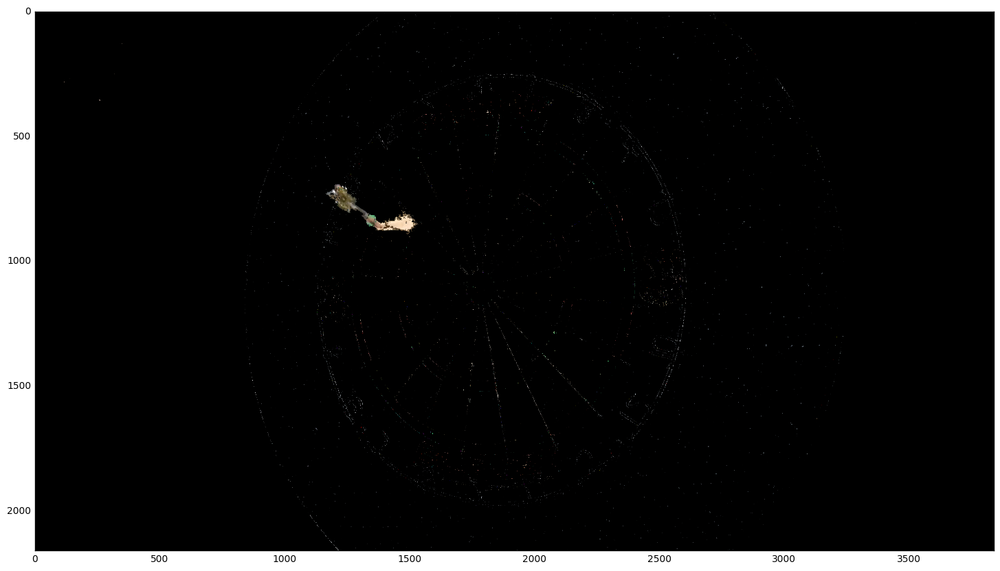

In [181]:
#maybe rather bitwise_and 

arrowmask = cv2.merge([fgmask,fgmask,fgmask])
targetim = arrowmask.copy()
ret = cv2.bitwise_and(frame,targetim, arrowmask)

plot(arrowmask,1)

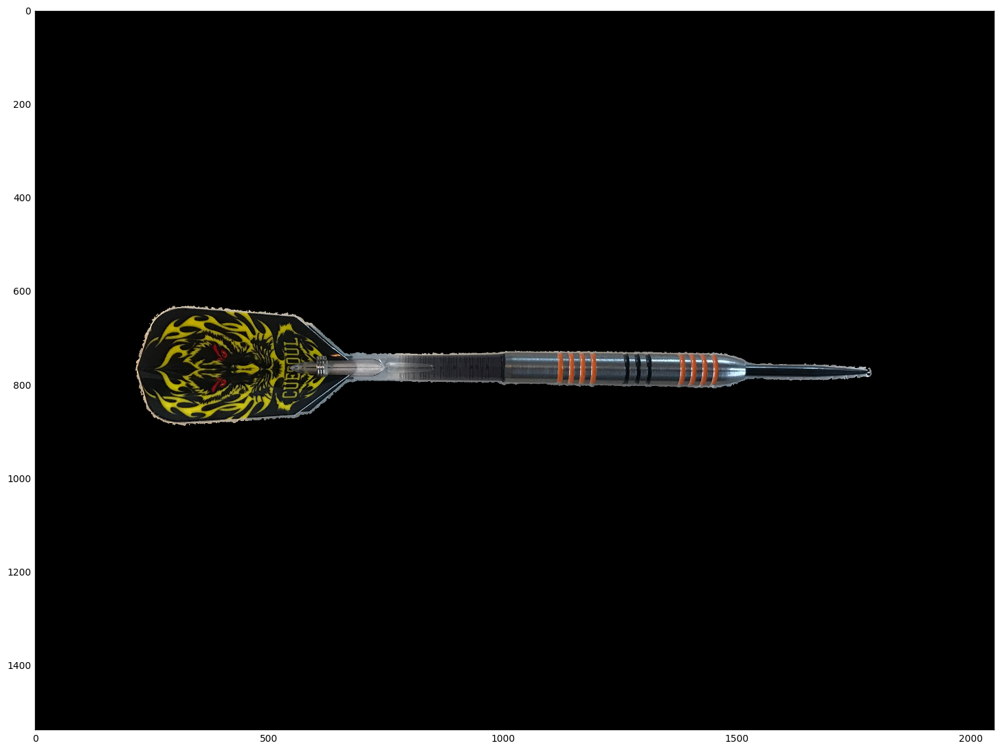

In [183]:
#let's try HAAR tranformation
#read target arrow
arrow = cv2.imread('samples/arrow.png',cv2.IMREAD_COLOR)
plot(arrow,1)